In [2]:
from geoband.API import *
GetCompasData('SBJ_2405_002', '19', '19.오산시_성연령별_유동인구.csv')
GetCompasData('SBJ_2405_002', '2', '2.오산시_상세도로망.geojson')
GetCompasData('SBJ_2405_002', '3', '3.오산시_도로명주소(도로).geojson')
GetCompasData('SBJ_2405_002', '4', '4.오산시_무인교통단속카메라현황.csv')
GetCompasData('SBJ_2405_002', '5', '5.오산시_교차로.geojson')
GetCompasData('SBJ_2405_002', '6', '6.오산시_교통사고이력.geojson')
GetCompasData('SBJ_2405_002', '7', '7.오산시_실폭도로.geojson')
GetCompasData('SBJ_2405_002', '8', '8.오산시_상권정보.csv')
GetCompasData('SBJ_2405_002', '9', '9.오산시_도로명주소(건물).geojson')
GetCompasData('SBJ_2405_002', '10', '10.오산시_표준노드정보.geojson')
GetCompasData('SBJ_2405_002', '11', '11.오산시_표준링크정보.geojson')
GetCompasData('SBJ_2405_002', '12', '12.오산시_격자(매핑용).geojson')
GetCompasData('SBJ_2405_002', '13', '13.오산시_어린이보호구역.csv')
GetCompasData('SBJ_2405_002', '14', '14.오산시_과속방지턱정보.csv')
GetCompasData('SBJ_2405_002', '15', '15.오산시_신호등현황.csv')
GetCompasData('SBJ_2405_002', '16', '16.오산시_횡단보도현황.csv')
GetCompasData('SBJ_2405_002', '17', '17.오산시_도로분리대.geojson')
GetCompasData('SBJ_2405_002', '18', '18.오산시_교통CCTV설치현황.csv')
GetCompasData('SBJ_2405_002', '19', '19.오산시_성연령별_유동인구.csv')
GetCompasData('SBJ_2405_002', '20', '20.오산시_시간대별_유동인구.csv')
GetCompasData('SBJ_2405_002', '21', '21.오산시_요일별_유동인구.csv')
GetCompasData('SBJ_2405_002', '22', '22.오산시_불법주정차단속이력.csv')
GetCompasData('SBJ_2405_002', '23', '23.오산시_격자별자동차등록현황.csv')
GetCompasData('SBJ_2405_002', '24', '24.오산시_주차장정보.csv')
GetCompasData('SBJ_2405_002', '25', '25.오산시_세교2지구_교통량사전계획.geojson')

[2024-07-09 21:53:39] 성공 - 19.오산시_성연령별_유동인구.csv


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import geopandas as gpd

In [2]:
# CSV 파일 로드
traffic_volume = pd.read_csv('./data/1.오산시_추정교통량.csv')
traffic_cameras = pd.read_csv('./data/4.오산시_무인교통단속카메라현황.csv')
child_safety_zones = pd.read_csv('./data/13.오산시_어린이보호구역.csv')
speed_bumps = pd.read_csv('./data/14.오산시_과속방지턱정보.csv')
traffic_signals = pd.read_csv('./data/15.오산시_신호등현황.csv')
crosswalks = pd.read_csv('./data/16.오산시_횡단보도현황.csv')
markets = pd.read_csv('./data/8.오산시_상권정보.csv')
illegal_parking = pd.read_csv('./data/22.오산시_불법주정차단속이력.csv')
car_registration = pd.read_csv('./data/23.오산시_격자별자동차등록현황.csv')
parking_lots = pd.read_csv('./data/24.오산시_주차장정보.csv')
cctv = pd.read_csv('./data/18.오산시_교통CCTV설치현황.csv')
population_by_age = pd.read_csv('./data/19.오산시_성연령별_유동인구.csv')
population_by_time = pd.read_csv('./data/20.오산시_시간대별_유동인구.csv')
population_by_day = pd.read_csv('./data/21.오산시_요일별_유동인구.csv')

# GeoJSON 파일 로드
detailed_road_network = gpd.read_file('./data/2.오산시_상세도로망.geojson')
road_addresses = gpd.read_file('./data/3.오산시_도로명주소(도로).geojson')
intersections = gpd.read_file('./data/5.오산시_교차로.geojson')
traffic_accidents = gpd.read_file('./data/6.오산시_교통사고이력.geojson')
narrow_roads = gpd.read_file('./data/7.오산시_실폭도로.geojson')
building_addresses = gpd.read_file('./data/9.오산시_도로명주소(건물).geojson')
standard_node_info = gpd.read_file('./data/10.오산시_표준노드정보.geojson')
standard_link_info = gpd.read_file('./data/11.오산시_표준링크정보.geojson')
grid_mapping = gpd.read_file('./data/12.오산시_격자(매핑용).geojson')
road_dividers = gpd.read_file('./data/17.오산시_도로분리대.geojson')
pre_traffic_plan = gpd.read_file('./data/25.오산시_세교2지구_교통량사전계획.geojson')

/opt/app-root/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (8) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
pd.set_option('display.max_colwidth', None)
grid_mapping['geometry']

0       POLYGON ((127.03147 37.16172, 127.03146 37.16262, 127.03259 37.16262, 127.03259 37.16172, 127.03147 37.16172))
1       POLYGON ((127.02455 37.18693, 127.02454 37.18783, 127.02567 37.18783, 127.02568 37.18693, 127.02455 37.18693))
2       POLYGON ((127.00432 37.17963, 127.00431 37.18053, 127.00544 37.18054, 127.00544 37.17964, 127.00432 37.17963))
3       POLYGON ((127.06522 37.16815, 127.06521 37.16906, 127.06634 37.16906, 127.06634 37.16816, 127.06522 37.16815))
4       POLYGON ((127.05956 37.17174, 127.05956 37.17264, 127.06069 37.17264, 127.06069 37.17174, 127.05956 37.17174))
                                                             ...                                                      
4505    POLYGON ((127.04834 37.16539, 127.04833 37.16629, 127.04946 37.16629, 127.04946 37.16539, 127.04834 37.16539))
4506    POLYGON ((127.02688 37.17432, 127.02688 37.17522, 127.02800 37.17522, 127.02801 37.17432, 127.02688 37.17432))
4507    POLYGON ((127.03809 37.18428, 127.03808 

In [4]:
polygon = []
for k in grid_mapping['geometry']:
    polygon.append(k.exterior.coords)
polygon[0][0]

(127.03146584159074, 37.161715774309094)

In [5]:
tmp = []
for pol in polygon:
    lon = []
    lat = []
    for k in pol:
        a, b = k
        lon.append(a)
        lat.append(b)
    tmp.append([(min(lon),max(lon)), (min(lat), max(lat))])
len(tmp)

4510

In [6]:
# 격자 데이터 기준으로 여러가지 데이터프레임 merging하기 위한 function
def mapping(gids, lst, lst2):
    ids = []
    for k in lst:
        for i,v in enumerate(lst2):
            if (v[0][0] <= k[0] < v[0][1]) & (v[1][0] <= k[1] < v[1][1]):
                ids.append(gids[i])
                break
    return ids

In [7]:
# 3년 전체 교통사고 칼럼 생성
traffic_accidents['total'] = traffic_accidents['accnt_2020'] + traffic_accidents['accnt_2021'] + traffic_accidents['accnt_2022']
traffic_accidents['total'] = traffic_accidents['total'].astype(int)
traffic_accidents

,gid,accnt_2020,accnt_2021,accnt_2022,geometry,total
0,다사584071,0.0,0.0,0.0,"POLYGON ((127.03147 37.16172, 127.03146 37.16262, 127.03259 37.16262, 127.03259 37.16172, 127.03147 37.16172))",0
1,다사578099,0.0,0.0,0.0,"POLYGON ((127.02455 37.18693, 127.02454 37.18783, 127.02567 37.18783, 127.02568 37.18693, 127.02455 37.18693))",0
2,다사560091,0.0,0.0,0.0,"POLYGON ((127.00432 37.17963, 127.00431 37.18053, 127.00544 37.18054, 127.00544 37.17964, 127.00432 37.17963))",0
3,다사614078,0.0,0.0,0.0,"POLYGON ((127.06522 37.16815, 127.06521 37.16906, 127.06634 37.16906, 127.06634 37.16816, 127.06522 37.16815))",0
4,다사609082,1.0,2.0,0.0,"POLYGON ((127.05956 37.17174, 127.05956 37.17264, 127.06069 37.17264, 127.06069 37.17174, 127.05956 37.17174))",3
...,...,...,...,...,...,...
4505,다사599075,0.0,0.0,0.0,"POLYGON ((127.04834 37.16539, 127.04833 37.16629, 127.04946 37.16629, 127.04946 37.16539, 127.04834 37.16539))",0
4506,다사580085,0.0,0.0,0.0,"POLYGON ((127.02688 37.17432, 127.02688 37.17522, 127.02800 37.17522, 127.02801 37.17432, 127.02688 37.17432))",0
4507,다사590096,0.0,0.0,1.0,"POLYGON ((127.03809 37.18428, 127.03808 37.18518, 127.03921 37.18518, 127.03921 37.18428, 127.03809 37.18428))",1
4508,다사631036,0.0,0.0,0.0,"POLYGON ((127.08457 37.13036, 127.08457 37.13127, 127.08569 37.13127, 127.08570 37.13037, 127.08457 37.13036))",0


### 18번 cctv

In [8]:
temp = []
for k in zip(cctv['lon'], cctv['lat']):
    temp.append(k)

In [9]:
len(temp)

130

In [10]:
tp = mapping(grid_mapping['gid'], temp, tmp)

In [11]:
cctv_yn = [1] *len(tp)

In [12]:
df = pd.DataFrame({
    'gid': tp,
    'cctv_yn': cctv_yn
})

In [13]:
merged_df = pd.merge(traffic_accidents, df, on='gid', how='outer')
merged_df = merged_df.fillna(0)
merged_df

,gid,accnt_2020,accnt_2021,accnt_2022,geometry,total,cctv_yn
0,다사584071,0.0,0.0,0.0,"POLYGON ((127.03147 37.16172, 127.03146 37.16262, 127.03259 37.16262, 127.03259 37.16172, 127.03147 37.16172))",0,0.0
1,다사578099,0.0,0.0,0.0,"POLYGON ((127.02455 37.18693, 127.02454 37.18783, 127.02567 37.18783, 127.02568 37.18693, 127.02455 37.18693))",0,0.0
2,다사560091,0.0,0.0,0.0,"POLYGON ((127.00432 37.17963, 127.00431 37.18053, 127.00544 37.18054, 127.00544 37.17964, 127.00432 37.17963))",0,0.0
3,다사614078,0.0,0.0,0.0,"POLYGON ((127.06522 37.16815, 127.06521 37.16906, 127.06634 37.16906, 127.06634 37.16816, 127.06522 37.16815))",0,0.0
4,다사609082,1.0,2.0,0.0,"POLYGON ((127.05956 37.17174, 127.05956 37.17264, 127.06069 37.17264, 127.06069 37.17174, 127.05956 37.17174))",3,1.0
...,...,...,...,...,...,...,...
4508,다사599075,0.0,0.0,0.0,"POLYGON ((127.04834 37.16539, 127.04833 37.16629, 127.04946 37.16629, 127.04946 37.16539, 127.04834 37.16539))",0,0.0
4509,다사580085,0.0,0.0,0.0,"POLYGON ((127.02688 37.17432, 127.02688 37.17522, 127.02800 37.17522, 127.02801 37.17432, 127.02688 37.17432))",0,0.0
4510,다사590096,0.0,0.0,1.0,"POLYGON ((127.03809 37.18428, 127.03808 37.18518, 127.03921 37.18518, 127.03921 37.18428, 127.03809 37.18428))",1,0.0
4511,다사631036,0.0,0.0,0.0,"POLYGON ((127.08457 37.13036, 127.08457 37.13127, 127.08569 37.13127, 127.08570 37.13037, 127.08457 37.13036))",0,0.0


In [14]:
merged_df['cctv_yn'] = merged_df['cctv_yn'].astype(int)

In [15]:
merged_df = merged_df.drop_duplicates()
merged_df = merged_df.reset_index()
merged_df.drop(['index'], axis = 1)

,gid,accnt_2020,accnt_2021,accnt_2022,geometry,total,cctv_yn
0,다사584071,0.0,0.0,0.0,"POLYGON ((127.03147 37.16172, 127.03146 37.16262, 127.03259 37.16262, 127.03259 37.16172, 127.03147 37.16172))",0,0
1,다사578099,0.0,0.0,0.0,"POLYGON ((127.02455 37.18693, 127.02454 37.18783, 127.02567 37.18783, 127.02568 37.18693, 127.02455 37.18693))",0,0
2,다사560091,0.0,0.0,0.0,"POLYGON ((127.00432 37.17963, 127.00431 37.18053, 127.00544 37.18054, 127.00544 37.17964, 127.00432 37.17963))",0,0
3,다사614078,0.0,0.0,0.0,"POLYGON ((127.06522 37.16815, 127.06521 37.16906, 127.06634 37.16906, 127.06634 37.16816, 127.06522 37.16815))",0,0
4,다사609082,1.0,2.0,0.0,"POLYGON ((127.05956 37.17174, 127.05956 37.17264, 127.06069 37.17264, 127.06069 37.17174, 127.05956 37.17174))",3,1
...,...,...,...,...,...,...,...
4505,다사599075,0.0,0.0,0.0,"POLYGON ((127.04834 37.16539, 127.04833 37.16629, 127.04946 37.16629, 127.04946 37.16539, 127.04834 37.16539))",0,0
4506,다사580085,0.0,0.0,0.0,"POLYGON ((127.02688 37.17432, 127.02688 37.17522, 127.02800 37.17522, 127.02801 37.17432, 127.02688 37.17432))",0,0
4507,다사590096,0.0,0.0,1.0,"POLYGON ((127.03809 37.18428, 127.03808 37.18518, 127.03921 37.18518, 127.03921 37.18428, 127.03809 37.18428))",1,0
4508,다사631036,0.0,0.0,0.0,"POLYGON ((127.08457 37.13036, 127.08457 37.13127, 127.08569 37.13127, 127.08570 37.13037, 127.08457 37.13036))",0,0


### 4. 무인 교통 단속 카메라

In [16]:
temp = []
for k in zip(traffic_cameras['lon'], traffic_cameras['lat']):
    temp.append(k)
len(temp)

87

In [17]:
tp = mapping(grid_mapping['gid'], temp, tmp)

In [18]:
camera_yn = [1] *len(tp)

In [19]:
traffic_cameras['gid'] = tp
traffic_cameras['camera_yn'] = camera_yn

In [20]:
camera_df = traffic_cameras[['gbn', 'gid', 'camera_yn']]
camera_df = camera_df.drop_duplicates()
camera_df

,gbn,gid,camera_yn
0,속도,다사620037,1
2,신호,다사630039,1
3,속도,다사633040,1
6,신호,다사629041,1
7,신호,다사620042,1
...,...,...,...
81,신호,다사627062,1
82,신호,다사625064,1
83,신호,다사620064,1
84,신호,다사625067,1


In [21]:
camera_df = camera_df.drop(11, axis=0)

In [22]:
merged_df2 = pd.merge(merged_df, camera_df, on='gid', how='outer')
merged_df2 = merged_df2.fillna(0)
merged_df2

,index,gid,accnt_2020,accnt_2021,accnt_2022,geometry,total,cctv_yn,gbn,camera_yn
0,0,다사584071,0.0,0.0,0.0,"POLYGON ((127.03147 37.16172, 127.03146 37.16262, 127.03259 37.16262, 127.03259 37.16172, 127.03147 37.16172))",0,0,0,0.0
1,1,다사578099,0.0,0.0,0.0,"POLYGON ((127.02455 37.18693, 127.02454 37.18783, 127.02567 37.18783, 127.02568 37.18693, 127.02455 37.18693))",0,0,0,0.0
2,2,다사560091,0.0,0.0,0.0,"POLYGON ((127.00432 37.17963, 127.00431 37.18053, 127.00544 37.18054, 127.00544 37.17964, 127.00432 37.17963))",0,0,0,0.0
3,3,다사614078,0.0,0.0,0.0,"POLYGON ((127.06522 37.16815, 127.06521 37.16906, 127.06634 37.16906, 127.06634 37.16816, 127.06522 37.16815))",0,0,0,0.0
4,4,다사609082,1.0,2.0,0.0,"POLYGON ((127.05956 37.17174, 127.05956 37.17264, 127.06069 37.17264, 127.06069 37.17174, 127.05956 37.17174))",3,1,0,0.0
...,...,...,...,...,...,...,...,...,...,...
4505,4508,다사599075,0.0,0.0,0.0,"POLYGON ((127.04834 37.16539, 127.04833 37.16629, 127.04946 37.16629, 127.04946 37.16539, 127.04834 37.16539))",0,0,0,0.0
4506,4509,다사580085,0.0,0.0,0.0,"POLYGON ((127.02688 37.17432, 127.02688 37.17522, 127.02800 37.17522, 127.02801 37.17432, 127.02688 37.17432))",0,0,0,0.0
4507,4510,다사590096,0.0,0.0,1.0,"POLYGON ((127.03809 37.18428, 127.03808 37.18518, 127.03921 37.18518, 127.03921 37.18428, 127.03809 37.18428))",1,0,0,0.0
4508,4511,다사631036,0.0,0.0,0.0,"POLYGON ((127.08457 37.13036, 127.08457 37.13127, 127.08569 37.13127, 127.08570 37.13037, 127.08457 37.13036))",0,0,0,0.0


In [23]:
merged_df2['camera_yn'] = merged_df2['camera_yn'].astype(int)
merged_df2['gbn'] = merged_df2['gbn'].replace(0, '없음')

### 15. 신호등현황

In [24]:
temp = []
for k in zip(traffic_signals['lon'], traffic_signals['lat']):
    temp.append(k)
len(temp)

3128

In [25]:
tp = mapping(grid_mapping['gid'], temp, tmp)

In [26]:
signal_yn = [1] *len(tp)

In [27]:
traffic_signals['gid'] = tp
traffic_signals['signal_yn'] = signal_yn
traffic_signals

,sgg_nm,rd_type,addr,rd_no,rd_nm,lon,lat,gid,signal_yn
0,오산시,시도,경기도 오산시 누읍동 589,NaN,누읍로,127.048227,37.141066,다사598048,1
1,오산시,기타,경기도 오산시 원동 792,NaN,대원로,127.073524,37.145604,다사621052,1
2,오산시,기타,경기도 오산시 원동 792,NaN,대원로,127.073524,37.145604,다사621052,1
3,오산시,기타,경기도 오산시 원동 792-1,NaN,대원로,127.074305,37.146950,다사621054,1
4,오산시,기타,경기도 오산시 원동 792-1,NaN,대원로,127.074305,37.146950,다사621054,1
...,...,...,...,...,...,...,...,...,...
3123,오산시,기타,경기도 오산시 부산동 778-5,NaN,운천로,127.080352,37.155988,다사627064,1
3124,오산시,기타,경기도 오산시 부산동 806,NaN,경기동로186번길,127.091175,37.150767,다사636058,1
3125,오산시,기타,경기도 오산시 원동 360-15,NaN,오산로160번길,127.072305,37.141625,다사620048,1
3126,오산시,기타,경기도 오산시 원동 360-15,NaN,오산로160번길,127.072305,37.141625,다사620048,1


In [28]:
value_counts = traffic_signals['gid'].value_counts()

# 데이터프레임으로 변환
df_value_counts = value_counts.reset_index()

# 컬럼명 지정
df_value_counts.columns = ['gid', 'signal_count']

In [29]:
from collections import Counter
types = []
for k in df_value_counts['gid']:
    ttt = traffic_signals[traffic_signals['gid'] == k]
    counter = Counter(ttt['rd_type'])
    most_common = counter.most_common(1)
    types.append(most_common[0][0])

In [30]:
df_value_counts['rd_type'] = types
df_value_counts

,gid,signal_count,rd_type
0,다사616074,50,기타
1,다사602088,50,기타
2,다사584074,48,기타
3,다사608067,47,기타
4,다사619046,46,기타
...,...,...,...
377,다사592041,1,시도
378,다사625041,1,시도
379,다사591092,1,시도
380,다사621039,1,일반국도


In [31]:
merged_df3 = pd.merge(merged_df2, df_value_counts, on='gid', how='outer')
merged_df3 = merged_df3.fillna(0)
merged_df3

,index,gid,accnt_2020,accnt_2021,accnt_2022,geometry,total,cctv_yn,gbn,camera_yn,signal_count,rd_type
0,0,다사584071,0.0,0.0,0.0,"POLYGON ((127.03147 37.16172, 127.03146 37.16262, 127.03259 37.16262, 127.03259 37.16172, 127.03147 37.16172))",0,0,없음,0,0.0,0
1,1,다사578099,0.0,0.0,0.0,"POLYGON ((127.02455 37.18693, 127.02454 37.18783, 127.02567 37.18783, 127.02568 37.18693, 127.02455 37.18693))",0,0,없음,0,0.0,0
2,2,다사560091,0.0,0.0,0.0,"POLYGON ((127.00432 37.17963, 127.00431 37.18053, 127.00544 37.18054, 127.00544 37.17964, 127.00432 37.17963))",0,0,없음,0,0.0,0
3,3,다사614078,0.0,0.0,0.0,"POLYGON ((127.06522 37.16815, 127.06521 37.16906, 127.06634 37.16906, 127.06634 37.16816, 127.06522 37.16815))",0,0,없음,0,0.0,0
4,4,다사609082,1.0,2.0,0.0,"POLYGON ((127.05956 37.17174, 127.05956 37.17264, 127.06069 37.17264, 127.06069 37.17174, 127.05956 37.17174))",3,1,없음,0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
4505,4508,다사599075,0.0,0.0,0.0,"POLYGON ((127.04834 37.16539, 127.04833 37.16629, 127.04946 37.16629, 127.04946 37.16539, 127.04834 37.16539))",0,0,없음,0,0.0,0
4506,4509,다사580085,0.0,0.0,0.0,"POLYGON ((127.02688 37.17432, 127.02688 37.17522, 127.02800 37.17522, 127.02801 37.17432, 127.02688 37.17432))",0,0,없음,0,0.0,0
4507,4510,다사590096,0.0,0.0,1.0,"POLYGON ((127.03809 37.18428, 127.03808 37.18518, 127.03921 37.18518, 127.03921 37.18428, 127.03809 37.18428))",1,0,없음,0,0.0,0
4508,4511,다사631036,0.0,0.0,0.0,"POLYGON ((127.08457 37.13036, 127.08457 37.13127, 127.08569 37.13127, 127.08570 37.13037, 127.08457 37.13036))",0,0,없음,0,0.0,0


In [32]:
merged_df3['signal_count'] = merged_df3['signal_count'].astype(int)
merged_df3['rd_type'] = merged_df3['rd_type'].replace(0, '없음')

In [33]:
data = merged_df3.drop(['index', 'geometry'], axis=1)
data

,gid,accnt_2020,accnt_2021,accnt_2022,total,cctv_yn,gbn,camera_yn,signal_count,rd_type
0,다사584071,0.0,0.0,0.0,0,0,없음,0,0,없음
1,다사578099,0.0,0.0,0.0,0,0,없음,0,0,없음
2,다사560091,0.0,0.0,0.0,0,0,없음,0,0,없음
3,다사614078,0.0,0.0,0.0,0,0,없음,0,0,없음
4,다사609082,1.0,2.0,0.0,3,1,없음,0,0,없음
...,...,...,...,...,...,...,...,...,...,...
4505,다사599075,0.0,0.0,0.0,0,0,없음,0,0,없음
4506,다사580085,0.0,0.0,0.0,0,0,없음,0,0,없음
4507,다사590096,0.0,0.0,1.0,1,0,없음,0,0,없음
4508,다사631036,0.0,0.0,0.0,0,0,없음,0,0,없음


### 16. 횡단보도

In [34]:
temp = []
for k in zip(crosswalks['lon'], crosswalks['lat']):
    temp.append(k)
len(temp)

1412

In [35]:
tp = mapping(grid_mapping['gid'], temp, tmp)
len(tp)

1412

In [36]:
crosswalk_yn = [1] *len(tp)

In [37]:
crosswalks['gid'] = tp
crosswalks['crosswalk_yn'] = crosswalk_yn

In [38]:
value_counts = crosswalks['gid'].value_counts()

# 데이터프레임으로 변환
df_value_counts = value_counts.reset_index()

# 컬럼명 지정
df_value_counts.columns = ['gid', 'crosswalks_count']

In [39]:
types = []
widths = []
lengths = []
for k in df_value_counts['gid']:
    ttt = crosswalks[crosswalks['gid'] == k]
    counter = Counter(ttt['crsswlk_type'])
    most_common = counter.most_common(1)
    types.append(most_common[0][0])
    widths.append(sum(ttt['crsswlk_wdth'])/len(ttt))
    lengths.append(sum(ttt['crsswlk_lngth'])/len(ttt))

In [40]:
df_value_counts['crsswlk_type'] = types
df_value_counts['crsswlk_wdth'] = widths
df_value_counts['crsswlk_lngth'] = lengths

In [41]:
merged_df4 = pd.merge(data, df_value_counts, on='gid', how='outer')
merged_df4 = merged_df4.fillna(0)

In [42]:
merged_df4['crosswalks_count'] = merged_df4['crosswalks_count'].astype(int)
merged_df4['crsswlk_type'] = merged_df4['crsswlk_type'].astype(int)
merged_df4

,gid,accnt_2020,accnt_2021,accnt_2022,total,cctv_yn,gbn,camera_yn,signal_count,rd_type,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth
0,다사584071,0.0,0.0,0.0,0,0,없음,0,0,없음,1,1,8.0,28.0
1,다사578099,0.0,0.0,0.0,0,0,없음,0,0,없음,0,0,0.0,0.0
2,다사560091,0.0,0.0,0.0,0,0,없음,0,0,없음,0,0,0.0,0.0
3,다사614078,0.0,0.0,0.0,0,0,없음,0,0,없음,0,0,0.0,0.0
4,다사609082,1.0,2.0,0.0,3,1,없음,0,0,없음,0,0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4505,다사599075,0.0,0.0,0.0,0,0,없음,0,0,없음,0,0,0.0,0.0
4506,다사580085,0.0,0.0,0.0,0,0,없음,0,0,없음,0,0,0.0,0.0
4507,다사590096,0.0,0.0,1.0,1,0,없음,0,0,없음,0,0,0.0,0.0
4508,다사631036,0.0,0.0,0.0,0,0,없음,0,0,없음,0,0,0.0,0.0


### 14. 과속방지턱

In [43]:
temp = []
for k in zip(speed_bumps['lon'], speed_bumps['lat']):
    temp.append(k)
len(temp)

1061

In [44]:
tp = mapping(grid_mapping['gid'], temp, tmp)
len(tp)

1061

In [45]:
speed_bumps_yn = [1] *len(tp)

In [46]:
speed_bumps['gid'] = tp
speed_bumps['crosswalk_yn'] = speed_bumps_yn
speed_bumps

,road_nm,inst_plc,fac_hght,fac_wdth,fac_lngth,sprtn,cntns,lon,lat,gid,crosswalk_yn
0,엘지로,김경자소문난대구왕뽈찜 인근,10,360,1000,Y,N,127.079872,37.126058,다사626031,1
1,동부대로,오산볼트공구 부근,10,360,800,Y,N,127.079340,37.126525,다사626031,1
2,동부대로,한솔애드 앞,10,360,500,Y,N,127.077012,37.127329,다사624032,1
3,동부대로,알엠 인근,10,360,1100,Y,N,127.077319,37.127560,다사624032,1
4,동부대로,일렉파워전자 앞,10,360,1100,Y,N,127.078047,37.127573,다사625032,1
...,...,...,...,...,...,...,...,...,...,...,...
1056,양산로,대림아파트 버스정류장 한일타운아파트 방면 150m,10,360,900,Y,N,127.036016,37.197777,다사588110,1
1057,양산로,세마 e편한세상 아파트 130동 사거리방면 앞,10,360,1200,Y,N,127.033259,37.197834,다사585111,1
1058,양산로,대림아파트 버스정류장 앞,10,360,900,Y,N,127.034529,37.197843,다사586111,1
1059,양산로,양산초교앞 사거리,10,360,300,Y,N,127.033044,37.197910,다사585111,1


In [47]:
value_counts = speed_bumps['gid'].value_counts()

# 데이터프레임으로 변환
df_value_counts = value_counts.reset_index()

# 컬럼명 지정
df_value_counts.columns = ['gid', 'speed_bumps_count']

In [48]:
heights = []
widths = []
lengths = []
for k in df_value_counts['gid']:
    ttt = speed_bumps[speed_bumps['gid'] == k]
    heights.append(sum(ttt['fac_hght'])/len(ttt))
    widths.append(sum(ttt['fac_wdth'])/len(ttt))
    lengths.append(sum(ttt['fac_lngth'])/len(ttt))

In [49]:
df_value_counts['fac_hght'] = heights
df_value_counts['fac_wdth'] = widths
df_value_counts['fac_lngth'] = lengths

In [50]:
merged_df5 = pd.merge(merged_df4, df_value_counts, on='gid', how='outer')
merged_df5 = merged_df5.fillna(0)
merged_df5['speed_bumps_count'] = merged_df5['speed_bumps_count'].astype(int)
merged_df5

,gid,accnt_2020,accnt_2021,accnt_2022,total,cctv_yn,gbn,camera_yn,signal_count,rd_type,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,speed_bumps_count,fac_hght,fac_wdth,fac_lngth
0,다사584071,0.0,0.0,0.0,0,0,없음,0,0,없음,1,1,8.0,28.0,0,0.0,0.0,0.0
1,다사578099,0.0,0.0,0.0,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0
2,다사560091,0.0,0.0,0.0,0,0,없음,0,0,없음,0,0,0.0,0.0,2,10.0,360.0,500.0
3,다사614078,0.0,0.0,0.0,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0
4,다사609082,1.0,2.0,0.0,3,1,없음,0,0,없음,0,0,0.0,0.0,1,10.0,360.0,600.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4505,다사599075,0.0,0.0,0.0,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0
4506,다사580085,0.0,0.0,0.0,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0
4507,다사590096,0.0,0.0,1.0,1,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0
4508,다사631036,0.0,0.0,0.0,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0


### 13. 어린이 보호구역

In [51]:
temp = []
for k in zip(child_safety_zones['lon'], child_safety_zones['lat']):
    temp.append(k)
len(temp)

83

In [52]:
tp = mapping(grid_mapping['gid'], temp, tmp)
len(tp)

83

In [53]:
child_safety_zones_yn = [1] *len(tp)

In [54]:
child_safety_zones['gid'] = tp
child_safety_zones['child_zones_yn'] = child_safety_zones_yn

In [55]:
child_zones = child_safety_zones[['gid', 'fac_type', 'cctv_state', 'road_bt', 'child_zones_yn']]
child_zones = child_zones.drop([52, 55], axis = 0)

In [56]:
merged_df6 = pd.merge(merged_df5, child_zones, on='gid', how='outer')
merged_df6 = merged_df6.fillna(0)
merged_df6['fac_type'] = merged_df6['fac_type'].replace(0, '없음')
merged_df6['cctv_state'] = merged_df6['cctv_state'].replace(0, '없음')
merged_df6['child_zones_yn'] = merged_df6['child_zones_yn'].astype(int)
merged_df6

,gid,accnt_2020,accnt_2021,accnt_2022,total,cctv_yn,gbn,camera_yn,signal_count,rd_type,...,crsswlk_wdth,crsswlk_lngth,speed_bumps_count,fac_hght,fac_wdth,fac_lngth,fac_type,cctv_state,road_bt,child_zones_yn
0,다사584071,0.0,0.0,0.0,0,0,없음,0,0,없음,...,8.0,28.0,0,0.0,0.0,0.0,없음,없음,0.0,0
1,다사578099,0.0,0.0,0.0,0,0,없음,0,0,없음,...,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
2,다사560091,0.0,0.0,0.0,0,0,없음,0,0,없음,...,0.0,0.0,2,10.0,360.0,500.0,없음,없음,0.0,0
3,다사614078,0.0,0.0,0.0,0,0,없음,0,0,없음,...,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
4,다사609082,1.0,2.0,0.0,3,1,없음,0,0,없음,...,0.0,0.0,1,10.0,360.0,600.0,없음,없음,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4505,다사599075,0.0,0.0,0.0,0,0,없음,0,0,없음,...,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
4506,다사580085,0.0,0.0,0.0,0,0,없음,0,0,없음,...,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
4507,다사590096,0.0,0.0,1.0,1,0,없음,0,0,없음,...,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
4508,다사631036,0.0,0.0,0.0,0,0,없음,0,0,없음,...,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0


In [57]:
data = merged_df6.drop(['accnt_2020', 'accnt_2021', 'accnt_2022'], axis=1)
data

,gid,total,cctv_yn,gbn,camera_yn,signal_count,rd_type,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,speed_bumps_count,fac_hght,fac_wdth,fac_lngth,fac_type,cctv_state,road_bt,child_zones_yn
0,다사584071,0,0,없음,0,0,없음,1,1,8.0,28.0,0,0.0,0.0,0.0,없음,없음,0.0,0
1,다사578099,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
2,다사560091,0,0,없음,0,0,없음,0,0,0.0,0.0,2,10.0,360.0,500.0,없음,없음,0.0,0
3,다사614078,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
4,다사609082,3,1,없음,0,0,없음,0,0,0.0,0.0,1,10.0,360.0,600.0,없음,없음,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4505,다사599075,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
4506,다사580085,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
4507,다사590096,1,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
4508,다사631036,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0


In [58]:
data.index = data['gid']

In [59]:
data = data.drop(['gid'], axis = 1)
data

,total,cctv_yn,gbn,camera_yn,signal_count,rd_type,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,speed_bumps_count,fac_hght,fac_wdth,fac_lngth,fac_type,cctv_state,road_bt,child_zones_yn
gid,,,,,,,,,,,,,,,,,,
다사584071,0,0,없음,0,0,없음,1,1,8.0,28.0,0,0.0,0.0,0.0,없음,없음,0.0,0
다사578099,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
다사560091,0,0,없음,0,0,없음,0,0,0.0,0.0,2,10.0,360.0,500.0,없음,없음,0.0,0
다사614078,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
다사609082,3,1,없음,0,0,없음,0,0,0.0,0.0,1,10.0,360.0,600.0,없음,없음,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
다사599075,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
다사580085,0,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0
다사590096,1,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0


In [60]:
data['acc_yn'] = data['total'].apply(lambda x: 1 if x != 0 else 0)

In [61]:
data = data.drop(['total'], axis=1)
data

,cctv_yn,gbn,camera_yn,signal_count,rd_type,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,speed_bumps_count,fac_hght,fac_wdth,fac_lngth,fac_type,cctv_state,road_bt,child_zones_yn,acc_yn
gid,,,,,,,,,,,,,,,,,,
다사584071,0,없음,0,0,없음,1,1,8.0,28.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0
다사578099,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0
다사560091,0,없음,0,0,없음,0,0,0.0,0.0,2,10.0,360.0,500.0,없음,없음,0.0,0,0
다사614078,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0
다사609082,1,없음,0,0,없음,0,0,0.0,0.0,1,10.0,360.0,600.0,없음,없음,0.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
다사599075,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0
다사580085,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0
다사590096,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,1


## Modeling

In [62]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb

In [63]:
# Feature selection and preprocessing
categorical_cols = ['gbn', 'rd_type', 'fac_type', 'cctv_state']
X = data.drop(columns=['acc_yn'])
X = pd.get_dummies(X, columns=categorical_cols, drop_first=True)  # Convert categorical variables to dummy variables
y = data['acc_yn']

In [64]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify = y)

# RandomForest
rf_clf = RandomForestClassifier(random_state=42)
rf_clf.fit(X_train, y_train)

# XGBoost
xgb_clf = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
xgb_clf.fit(X_train, y_train)

# LightGBM
lgb_clf = lgb.LGBMClassifier(random_state=42)
lgb_clf.fit(X_train, y_train)

[21:26:07] WARNING: /workspace/src/learner.cc:480: 
Parameters: { use_label_encoder } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




LGBMClassifier(random_state=42)

Model: RandomForestClassifier
              precision    recall  f1-score   support

           0       0.85      0.94      0.89      1071
           1       0.62      0.37      0.47       282

    accuracy                           0.82      1353
   macro avg       0.74      0.66      0.68      1353
weighted avg       0.80      0.82      0.80      1353



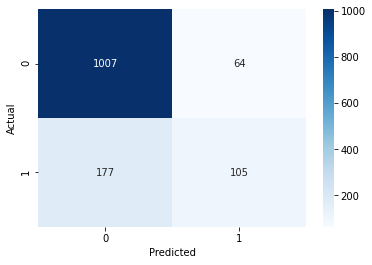

Model: XGBClassifier
              precision    recall  f1-score   support

           0       0.85      0.95      0.90      1071
           1       0.67      0.36      0.47       282

    accuracy                           0.83      1353
   macro avg       0.76      0.66      0.68      1353
weighted avg       0.81      0.83      0.81      1353



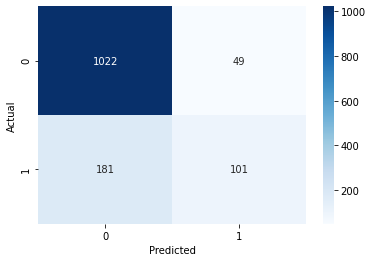

Model: LGBMClassifier
              precision    recall  f1-score   support

           0       0.85      0.94      0.89      1071
           1       0.63      0.36      0.46       282

    accuracy                           0.82      1353
   macro avg       0.74      0.65      0.68      1353
weighted avg       0.80      0.82      0.80      1353



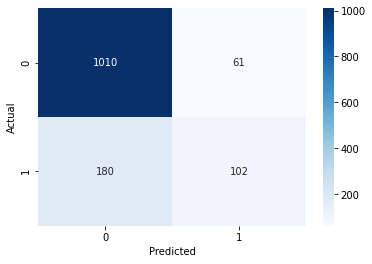

In [65]:
# 모델 평가
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    print(f"Model: {model.__class__.__name__}")
    print(classification_report(y_test, y_pred))
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# 각 모델 평가
evaluate_model(rf_clf, X_test, y_test)
evaluate_model(xgb_clf, X_test, y_test)
evaluate_model(lgb_clf, X_test, y_test)

In [66]:
# 그래프에 한글표현 잘 나타나도록
!pip install koreanize-matplotlib
import koreanize_matplotlib
%config InlineBackend.figure_format = 'retina'

### Feature importance 분석

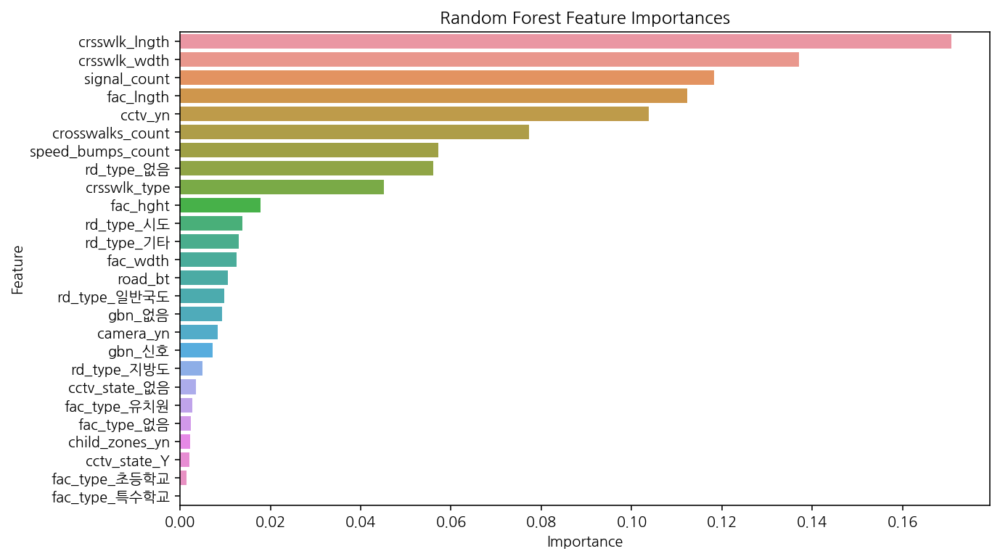

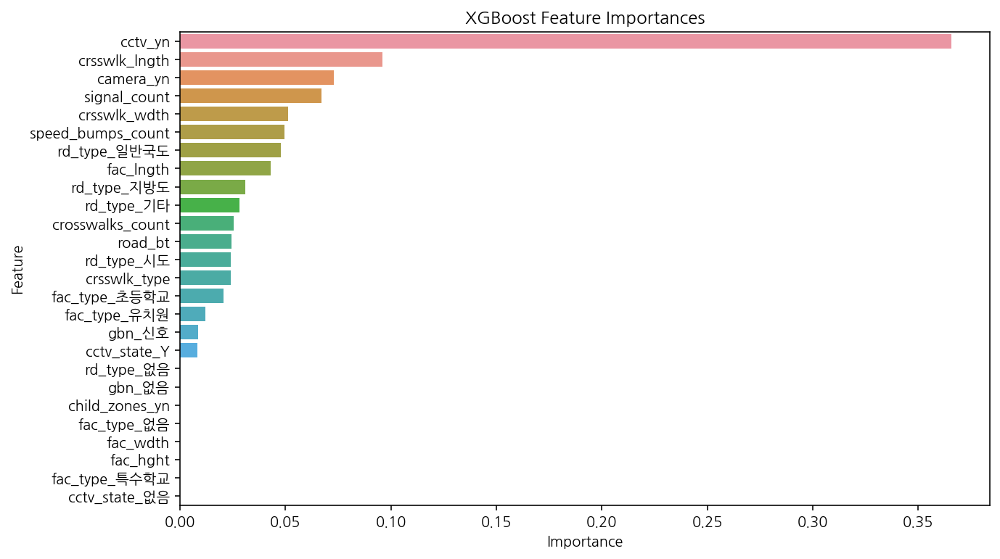

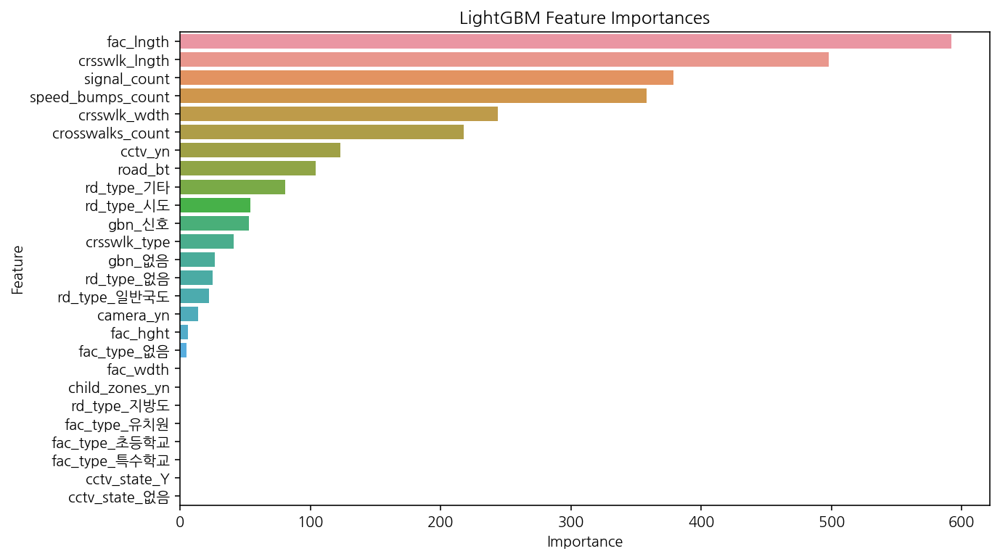

In [79]:
def plot_feature_importance_seaborn(model, title):
    importances = model.feature_importances_
    feature_names = X_train.columns
    feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    feature_importances = feature_importances.sort_values(by='Importance', ascending=False)
    
    plt.figure(figsize=(10, 6))
    sns.barplot(data=feature_importances, x='Importance', y='Feature')
    plt.title(title)
    plt.show()

plot_feature_importance_seaborn(rf_clf, 'Random Forest Feature Importances')
plot_feature_importance_seaborn(xgb_clf, 'XGBoost Feature Importances')
plot_feature_importance_seaborn(lgb_clf, 'LightGBM Feature Importances')

In [76]:
# XAI library : LIME
!pip install lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=['No Accident', 'Accident'], discretize_continuous=True)
# Explain a single prediction with LIME
i = 0
exp = explainer.explain_instance(X_test.values[i], rf_clf.predict_proba, num_features=10)
# exp.show_in_notebook(show_all=False)

In [75]:
exp = explainer.explain_instance(X_test.values[185], rf_clf.predict_proba, num_features=10)
exp.show_in_notebook(show_all=False)

In [74]:
X_test[185:186]

,cctv_yn,camera_yn,signal_count,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,speed_bumps_count,fac_hght,fac_wdth,...,rd_type_시도,rd_type_없음,rd_type_일반국도,rd_type_지방도,fac_type_없음,fac_type_유치원,fac_type_초등학교,fac_type_특수학교,cctv_state_Y,cctv_state_없음
gid,,,,,,,,,,,,,,,,,,,,,
다사593086,0,0,0,0,0,0.0,0.0,0,0.0,0.0,...,0,1,0,0,1,0,0,0,0,1


In [86]:
exp = explainer.explain_instance(X_test.values[120], rf_clf.predict_proba, num_features=10)
exp.show_in_notebook(show_all=False)

In [85]:
X_test[120:121]

,cctv_yn,camera_yn,signal_count,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,speed_bumps_count,fac_hght,fac_wdth,...,rd_type_시도,rd_type_없음,rd_type_일반국도,rd_type_지방도,fac_type_없음,fac_type_유치원,fac_type_초등학교,fac_type_특수학교,cctv_state_Y,cctv_state_없음
gid,,,,,,,,,,,,,,,,,,,,,
다사605065,1,0,0,0,0,0.0,0.0,0,0.0,0.0,...,0,1,0,0,1,0,0,0,0,1


### 실제 사고가 없는 데이터에 대해서 88%의 확률로 사고가 없다고 판단
### 실제 사고가 있는 데이터에 대해서 86%의 확률로 사고가 있다고 판단

## Tabnet 적용

Device used : cpu
epoch 0  | loss: 1.35866 | train_accuracy: 0.22523 | valid_accuracy: 0.22161 |  0:00:01s
epoch 1  | loss: 0.96034 | train_accuracy: 0.23112 | valid_accuracy: 0.2313  |  0:00:02s
epoch 2  | loss: 0.7914  | train_accuracy: 0.2377  | valid_accuracy: 0.23684 |  0:00:03s
epoch 3  | loss: 0.69483 | train_accuracy: 0.20236 | valid_accuracy: 0.20499 |  0:00:05s
epoch 4  | loss: 0.68415 | train_accuracy: 0.20686 | valid_accuracy: 0.20083 |  0:00:06s
epoch 5  | loss: 0.64085 | train_accuracy: 0.20963 | valid_accuracy: 0.2036  |  0:00:08s
epoch 6  | loss: 0.63622 | train_accuracy: 0.77616 | valid_accuracy: 0.78393 |  0:00:09s
epoch 7  | loss: 0.61603 | train_accuracy: 0.7772  | valid_accuracy: 0.79363 |  0:00:10s
epoch 8  | loss: 0.60348 | train_accuracy: 0.80388 | valid_accuracy: 0.80886 |  0:00:12s
epoch 9  | loss: 0.59094 | train_accuracy: 0.79556 | valid_accuracy: 0.79501 |  0:00:13s
epoch 10 | loss: 0.60996 | train_accuracy: 0.78274 | valid_accuracy: 0.79501 |  0:00:14s
epo

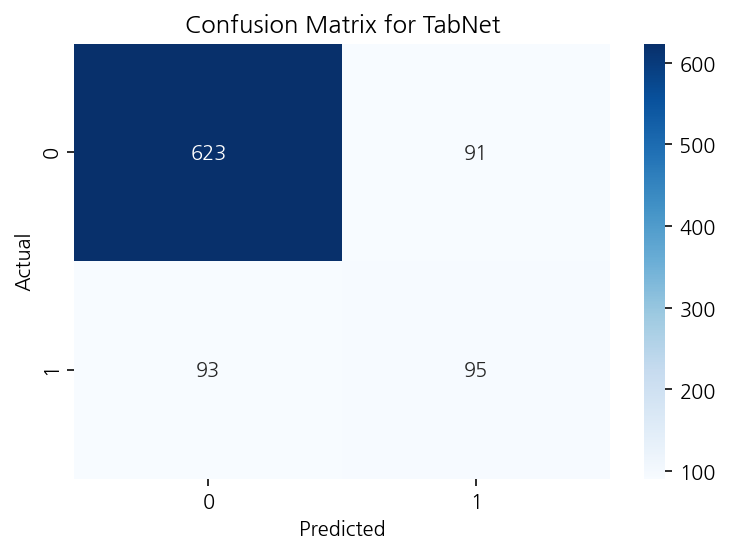

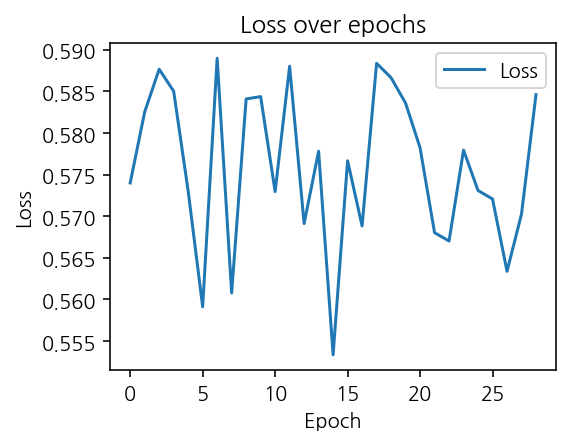

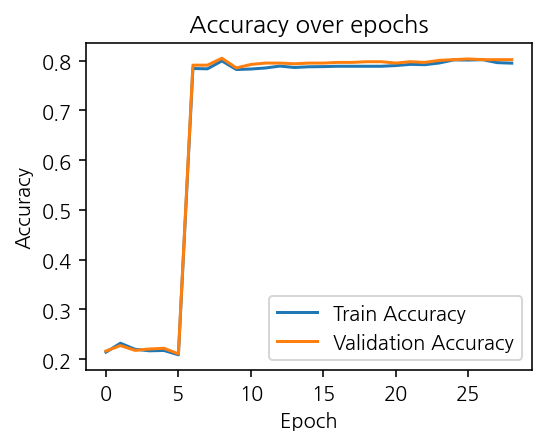

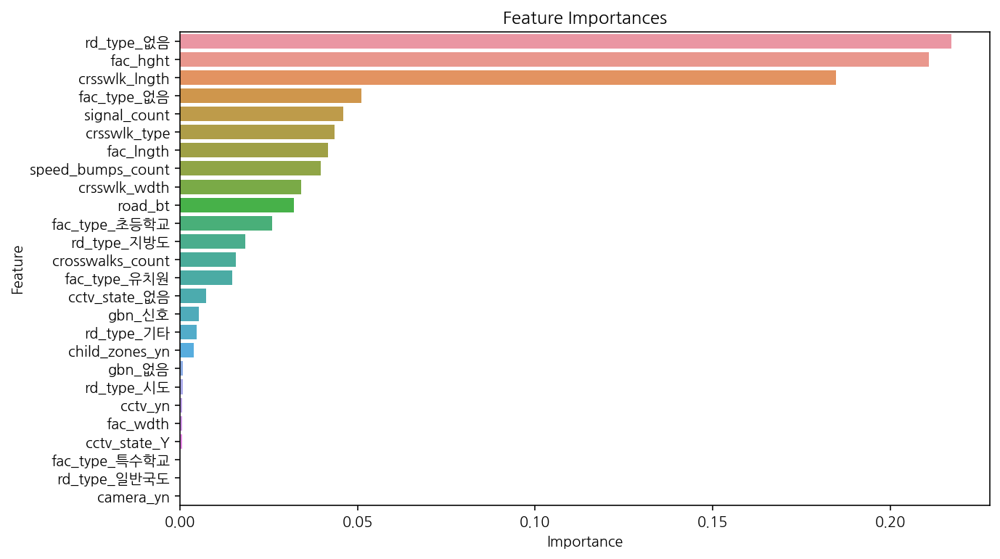

,Feature,Importance
17,rd_type_없음,2.171778e-01
8,fac_hght,2.109170e-01
6,crsswlk_lngth,1.847010e-01
20,fac_type_없음,5.103363e-02
2,signal_count,4.606267e-02
4,crsswlk_type,4.349185e-02
10,fac_lngth,4.161498e-02
7,speed_bumps_count,3.955240e-02
5,crsswlk_wdth,3.411314e-02
11,road_bt,3.198522e-02


In [73]:
from pytorch_tabnet.tab_model import TabNetClassifier
# Split the dataset into training, validation, and testing sets
X_train_all, X_test, y_train_all, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train_all, y_train_all, test_size=0.2, random_state=42, stratify=y_train_all)

# TabNet requires numpy arrays
X_train = X_train.values
X_valid = X_val.values
X_test = X_test.values
y_train = y_train.values
y_valid = y_val.values
y_test = y_test.values

# Define and train the TabNet model
max_epochs = 100
save_history = []

clf = TabNetClassifier()
for _ in range(2):
    clf.fit(
        X_train=X_train, y_train=y_train,
        eval_set=[(X_train, y_train), (X_valid, y_valid)],
        eval_name=['train', 'valid'],
        eval_metric=['accuracy'],
        max_epochs=max_epochs, patience=20,
        batch_size=1024, virtual_batch_size=128,
        num_workers=0,
        weights=1,
        drop_last=False
    )
    save_history.append(clf.history["valid_accuracy"])

# Predict and evaluate the model on the test set
y_pred = clf.predict(X_test)

print(classification_report(y_test, y_pred))

# Display confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix for TabNet")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Plot losses
plt.figure(figsize=(4,3))
plt.plot(clf.history['loss'], label='Loss')
plt.title('Loss over epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot AUC
plt.figure(figsize=(4,3))
plt.plot(clf.history['train_accuracy'], label='Train Accuracy')
plt.plot(clf.history['valid_accuracy'], label='Validation Accuracy')
plt.title('Accuracy over epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Extract feature importance
feature_importances_ = clf.feature_importances_
feature_names = X.columns

# Create a DataFrame for feature importances
feature_importances_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances_})

# Sort the DataFrame by importance
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10,6))
sns.barplot(x='Importance', y='Feature', data=feature_importances_df)
plt.title('Feature Importances')
plt.show()

# Display feature importances DataFrame
feature_importances_df

## Visualization

In [90]:
grid_sorted = grid_mapping.sort_values(by='gid')

In [93]:
data2 = data.sort_values(by='gid')

In [94]:
merged_df = pd.merge(data2, grid_sorted, on='gid', how='outer')
merged_df

,gid,cctv_yn,gbn,camera_yn,signal_count,rd_type,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,speed_bumps_count,fac_hght,fac_wdth,fac_lngth,fac_type,cctv_state,road_bt,child_zones_yn,acc_yn,geometry
0,다사551085,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((126.99422 37.17418, 126.99421 37.17508, 126.99534 37.17509, 126.99534 37.17419, 126.99422 37.17418))"
1,다사551086,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((126.99421 37.17508, 126.99420 37.17599, 126.99533 37.17599, 126.99534 37.17509, 126.99421 37.17508))"
2,다사551087,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((126.99420 37.17599, 126.99420 37.17689, 126.99532 37.17689, 126.99533 37.17599, 126.99420 37.17599))"
3,다사551088,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((126.99420 37.17689, 126.99419 37.17779, 126.99532 37.17779, 126.99532 37.17689, 126.99420 37.17689))"
4,다사552085,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((126.99534 37.17419, 126.99534 37.17509, 126.99646 37.17509, 126.99647 37.17419, 126.99534 37.17419))"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4505,다사646052,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((127.10138 37.14484, 127.10138 37.14575, 127.10250 37.14575, 127.10251 37.14485, 127.10138 37.14484))"
4506,다사646053,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((127.10138 37.14575, 127.10137 37.14665, 127.10250 37.14665, 127.10250 37.14575, 127.10138 37.14575))"
4507,다사647050,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((127.10252 37.14305, 127.10251 37.14395, 127.10364 37.14395, 127.10365 37.14305, 127.10252 37.14305))"
4508,다사647051,0,없음,0,0,없음,0,0,0.0,0.0,0,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((127.10251 37.14395, 127.10251 37.14485, 127.10364 37.14485, 127.10364 37.14395, 127.10251 37.14395))"


In [95]:
traffic_accidents = traffic_accidents.sort_values(by='gid')
traffic = traffic_accidents[['gid', 'total']]
df = pd.merge(merged_df, traffic, on='gid', how='outer')
df

,gid,cctv_yn,gbn,camera_yn,signal_count,rd_type,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,...,fac_hght,fac_wdth,fac_lngth,fac_type,cctv_state,road_bt,child_zones_yn,acc_yn,geometry,total
0,다사551085,0,없음,0,0,없음,0,0,0.0,0.0,...,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((126.99422 37.17418, 126.99421 37.17508, 126.99534 37.17509, 126.99534 37.17419, 126.99422 37.17418))",0
1,다사551086,0,없음,0,0,없음,0,0,0.0,0.0,...,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((126.99421 37.17508, 126.99420 37.17599, 126.99533 37.17599, 126.99534 37.17509, 126.99421 37.17508))",0
2,다사551087,0,없음,0,0,없음,0,0,0.0,0.0,...,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((126.99420 37.17599, 126.99420 37.17689, 126.99532 37.17689, 126.99533 37.17599, 126.99420 37.17599))",0
3,다사551088,0,없음,0,0,없음,0,0,0.0,0.0,...,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((126.99420 37.17689, 126.99419 37.17779, 126.99532 37.17779, 126.99532 37.17689, 126.99420 37.17689))",0
4,다사552085,0,없음,0,0,없음,0,0,0.0,0.0,...,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((126.99534 37.17419, 126.99534 37.17509, 126.99646 37.17509, 126.99647 37.17419, 126.99534 37.17419))",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4505,다사646052,0,없음,0,0,없음,0,0,0.0,0.0,...,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((127.10138 37.14484, 127.10138 37.14575, 127.10250 37.14575, 127.10251 37.14485, 127.10138 37.14484))",0
4506,다사646053,0,없음,0,0,없음,0,0,0.0,0.0,...,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((127.10138 37.14575, 127.10137 37.14665, 127.10250 37.14665, 127.10250 37.14575, 127.10138 37.14575))",0
4507,다사647050,0,없음,0,0,없음,0,0,0.0,0.0,...,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((127.10252 37.14305, 127.10251 37.14395, 127.10364 37.14395, 127.10365 37.14305, 127.10252 37.14305))",0
4508,다사647051,0,없음,0,0,없음,0,0,0.0,0.0,...,0.0,0.0,0.0,없음,없음,0.0,0,0,"POLYGON ((127.10251 37.14395, 127.10251 37.14485, 127.10364 37.14485, 127.10364 37.14395, 127.10251 37.14395))",0


In [98]:
from folium import IFrame
center = (37.16172, 127.03147)
zoom = 12

def style_function(feature):
    accnt_total = feature['properties']['total']
    fillColor = 'red' if accnt_total >= 4 else ('orange' if 1 <= accnt_total < 4 else 'green')
    return {'fillColor': fillColor, 'color': 'black', 'weight': 2, 'fillOpacity': 0.6}

m = folium.Map(location = center, 
               zoom_start = zoom,
               attr = '오산시'
              )
folium.GeoJson(
    traffic_accidents,
    style_function=style_function
).add_to(m)

m

In [100]:
for idx, row in df[3500:4000].iterrows():
    centroid = row['geometry'].centroid
    accnt_total = row['total']
    crosswalks_lngth = row['crsswlk_lngth']
    crosswalks_wdth = row['crsswlk_wdth']
    signal_count = row['signal_count']
    fac_lngth = row['fac_lngth']
    cctv_yn = row['cctv_yn']
    # 마커 색상 설정
    if accnt_total >= 4:
        marker_color = 'red'
    elif 1 <= accnt_total < 4:
        marker_color = 'orange'
    else:
        marker_color = 'green'
        
    popup_html = f"""
        <div style="font-size: 12pt; font-family: Arial, sans-serif; width:250px; overflow-y:auto;">
            <strong style="color: {marker_color};">총 교통사고 수:</strong> <span style="color: {marker_color};">{accnt_total}</span><br>
            <strong>CCTV 유무:</strong> {cctv_yn}<br>
            <strong>횡단보도 길이, 너비:</strong> {crosswalks_lngth}m, {crosswalks_wdth}m<br>
            <strong>신호등 유무:</strong> {signal_count}<br>
            <strong>과속방지턱 연장길이:</strong> {fac_lngth}
        </div>
        """
    
    folium.Marker(
        location=[centroid.y, centroid.x],
        popup=popup_html,
        icon=folium.Icon(color=marker_color)
    ).add_to(m)

In [101]:
m

In [102]:
recommeded_location = pd.DataFrame()

### 첫번째 위치 선정 : 모델링 결과 + 시각화를 통한 위치 선정
- 실제로 사고가 많이 일어남
- CCTV 있음
- 신호동 개수가 4개 이상
- 시각화를 통해 실제로 필요한 구간

In [105]:
df[(df['total'] != 0) & (df['cctv_yn'] == 1) & (df['signal_count'] >= 4)]['gid']

586     다사576109
777     다사581081
1507    다사591099
1580    다사592094
1892    다사596087
2191    다사600085
2474    다사604071
2489    다사604086
2763    다사608068
3058    다사612061
3139    다사613065
3236    다사614081
3240    다사614085
3334    다사615102
3344    다사616037
3357    다사616050
3361    다사616054
3416    다사617040
3424    다사617048
3558    다사619048
3582    다사619072
3623    다사620048
3681    다사621048
3734    다사622053
3737    다사622056
3780    다사623055
3871    다사625064
3875    다사625068
4136    다사632048
Name: gid, dtype: object

In [106]:
recommend1 = df[df['gid'] == '다사622056']
recommend1

,gid,cctv_yn,gbn,camera_yn,signal_count,rd_type,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,...,fac_hght,fac_wdth,fac_lngth,fac_type,cctv_state,road_bt,child_zones_yn,acc_yn,geometry,total
3737,다사622056,1,없음,0,7,시도,6,1,6.0,23.0,...,0.0,0.0,0.0,없음,없음,0.0,0,1,"POLYGON ((127.07434 37.14836, 127.07433 37.14926, 127.07546 37.14926, 127.07547 37.14836, 127.07434 37.14836))",23


In [107]:
recommeded_location = pd.concat([recommeded_location, recommend1])

### 두번째 위치 선정 : 모델리의 조건을 그대로 차용한 위치
- CCTV 있음
- 횡단보도 길이 12이상
- 횡단보도 너비 4 이상
- 신호등 수 4개 이상
- 과속방지턱 500이상

In [109]:
df[(df['crsswlk_lngth'] >= 12) & (df['crsswlk_wdth'] >= 4) & (df['cctv_yn'] == 1) & (df['total'] != 0) & (df['signal_count'] >= 4) & (df['fac_lngth'] >= 500)]

,gid,cctv_yn,gbn,camera_yn,signal_count,rd_type,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,...,fac_hght,fac_wdth,fac_lngth,fac_type,cctv_state,road_bt,child_zones_yn,acc_yn,geometry,total
3058,다사612061,1,신호,1,7,기타,3,1,5.333333,23.333333,...,10.0,360.0,666.666667,유치원,N,6.0,1,1,"POLYGON ((127.06305 37.15282, 127.06305 37.15372, 127.06417 37.15373, 127.06418 37.15283, 127.06305 37.15282))",9
3357,다사616050,1,없음,0,9,시도,2,1,4.000000,17.500000,...,10.0,360.0,550.000000,없음,없음,0.0,0,1,"POLYGON ((127.06761 37.14292, 127.06761 37.14382, 127.06873 37.14383, 127.06874 37.14293, 127.06761 37.14292))",8
3416,다사617040,1,신호,1,15,기타,1,1,6.000000,15.000000,...,10.0,360.0,1200.000000,없음,없음,0.0,0,1,"POLYGON ((127.06879 37.13391, 127.06879 37.13482, 127.06991 37.13482, 127.06992 37.13392, 127.06879 37.13391))",2
3424,다사617048,1,없음,0,8,기타,1,1,6.000000,20.000000,...,10.0,360.0,600.000000,없음,없음,0.0,0,1,"POLYGON ((127.06875 37.14112, 127.06874 37.14203, 127.06987 37.14203, 127.06988 37.14113, 127.06875 37.14112))",3


In [110]:
recommend2 = df[df['gid'] == '다사616050']
recommend2

,gid,cctv_yn,gbn,camera_yn,signal_count,rd_type,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,...,fac_hght,fac_wdth,fac_lngth,fac_type,cctv_state,road_bt,child_zones_yn,acc_yn,geometry,total
3357,다사616050,1,없음,0,9,시도,2,1,4.0,17.5,...,10.0,360.0,550.0,없음,없음,0.0,0,1,"POLYGON ((127.06761 37.14292, 127.06761 37.14382, 127.06873 37.14383, 127.06874 37.14293, 127.06761 37.14292))",8


In [111]:
recommeded_location = pd.concat([recommeded_location, recommend2])

### 3번째 위치 선정 : 시각화를 통한 사고다발 구간
- 사고다발 구간 밀집
- 모델링으로는 판별이 잘 안됨
- 교차로

![nn](reco.png)

In [112]:
recommend3 = df[df['gid'] == '다사608068']
recommend3

,gid,cctv_yn,gbn,camera_yn,signal_count,rd_type,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,...,fac_hght,fac_wdth,fac_lngth,fac_type,cctv_state,road_bt,child_zones_yn,acc_yn,geometry,total
2763,다사608068,1,없음,0,4,기타,1,1,2.0,11.0,...,10.0,360.0,700.0,없음,없음,0.0,0,1,"POLYGON ((127.05851 37.15912, 127.05851 37.16002, 127.05963 37.16002, 127.05964 37.15912, 127.05851 37.15912))",12


In [113]:
recommeded_location = pd.concat([recommeded_location, recommend3])
recommeded_location

,gid,cctv_yn,gbn,camera_yn,signal_count,rd_type,crosswalks_count,crsswlk_type,crsswlk_wdth,crsswlk_lngth,...,fac_hght,fac_wdth,fac_lngth,fac_type,cctv_state,road_bt,child_zones_yn,acc_yn,geometry,total
3737,다사622056,1,없음,0,7,시도,6,1,6.0,23.0,...,0.0,0.0,0.0,없음,없음,0.0,0,1,"POLYGON ((127.07434 37.14836, 127.07433 37.14926, 127.07546 37.14926, 127.07547 37.14836, 127.07434 37.14836))",23
3357,다사616050,1,없음,0,9,시도,2,1,4.0,17.5,...,10.0,360.0,550.0,없음,없음,0.0,0,1,"POLYGON ((127.06761 37.14292, 127.06761 37.14382, 127.06873 37.14383, 127.06874 37.14293, 127.06761 37.14292))",8
2763,다사608068,1,없음,0,4,기타,1,1,2.0,11.0,...,10.0,360.0,700.0,없음,없음,0.0,0,1,"POLYGON ((127.05851 37.15912, 127.05851 37.16002, 127.05963 37.16002, 127.05964 37.15912, 127.05851 37.15912))",12


In [115]:
recommeded_location.to_csv('./recommend_through_accidents.csv')

### 추천된 위치 시각화

In [117]:
def style_function(feature):
    gid_value = feature['properties']['gid']
    accnt_total = feature['properties']['total']
    if (gid_value == '다사622056') or (gid_value == '다사616050') or (gid_value == '다사608068'):
        return {'fillColor': 'blue', 'color': 'black', 'weight': 2, 'fillOpacity': 0.6}
    else:
        fillColor = 'red' if accnt_total >= 4 else ('orange' if 1 <= accnt_total < 4 else 'green')
        return {'fillColor': fillColor, 'color': 'black', 'weight': 2, 'fillOpacity': 0.6}

m = folium.Map(location = center, 
               zoom_start = zoom,
               attr = '오산시'
              )
folium.GeoJson(
    traffic_accidents,
    style_function=style_function
).add_to(m)
m